In [1]:
# -*- coding: utf-8 -*-
%matplotlib inline
import numpy as np
import cv2
import glob
import re
from matplotlib import pyplot as plt
import time as t
print "OpenCV Version : %s " % cv2.__version__
# https://wiki.python.org/moin/PythonSpeed/PerformanceTips
# http://www.2diabolos.com/blog/python-and-spyder/optimize-your-opencv-code-with-numpy/
# http://opencv-python-tutroals.readthedocs.org/en/latest/py_tutorials/py_core/py_optimization/py_optimization.html

OpenCV Version : 2.4.11 


In [33]:
w = 640
h = 480
RESOLUTION = (w, h)
grid_w = 7
grid_h = 7
GRID_SIZE = (grid_w, grid_h)
sq_size = 3 # cm
crit = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)

objp = np.zeros((grid_w*grid_h,3), np.float32)
objp[:,:2] = np.mgrid[0:grid_w,0:grid_h].T.reshape(-1,2) * sq_size

fig_size = plt.rcParams["figure.figsize"]
fig_size[0] = 18
fig_size[1] = 12
plt.rcParams["figure.figsize"] = fig_size

## Extracción de imágenes utilizables


Primer conjunto

Image1-L.jpg False
Image1-R.jpg False


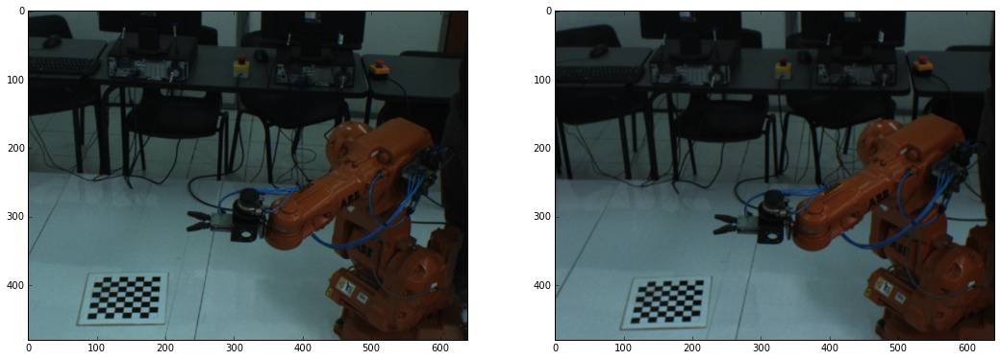

Image10-L.jpg True
Image10-R.jpg True


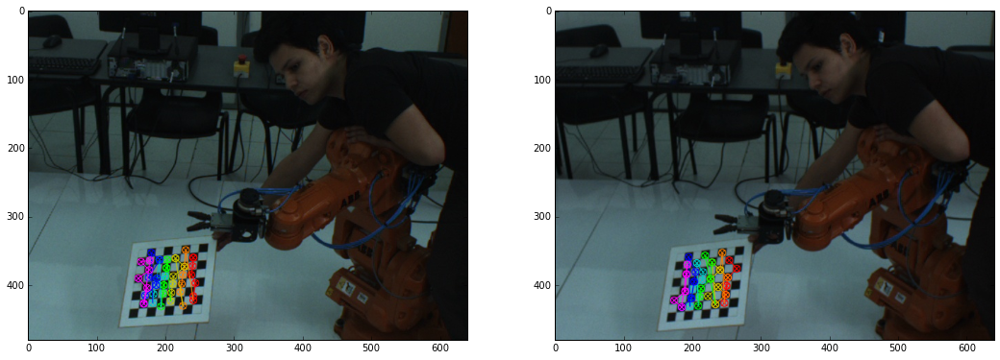

Image2-L.jpg True
Image2-R.jpg True


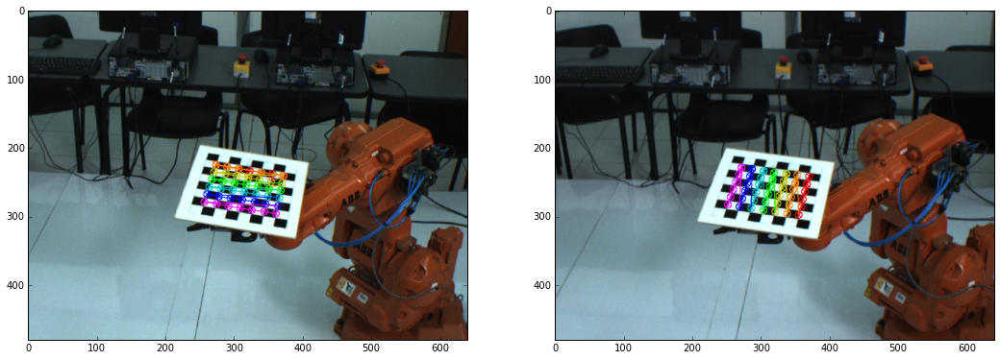

Image3-L.jpg True
Image3-R.jpg True


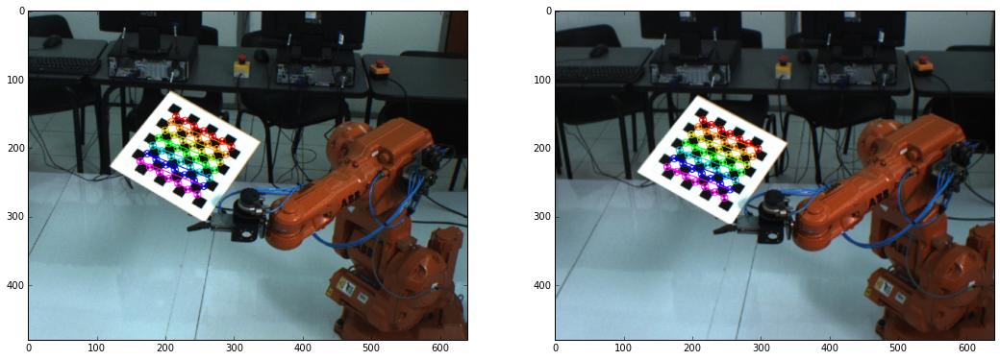

Image4-L.jpg True
Image4-R.jpg False


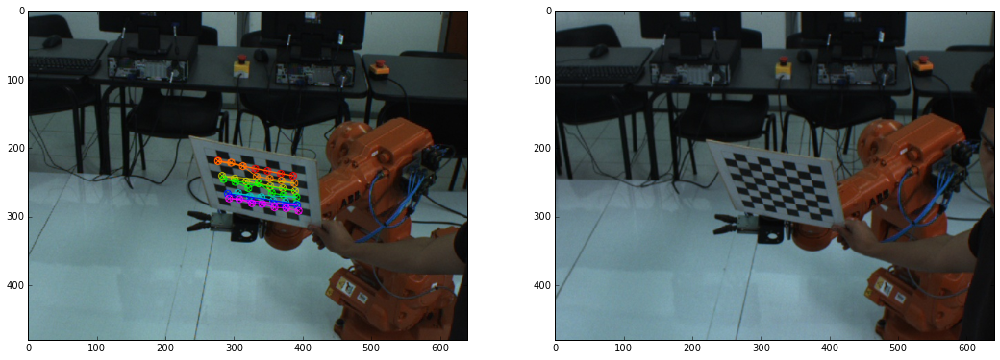

Image5-L.jpg True
Image5-R.jpg True


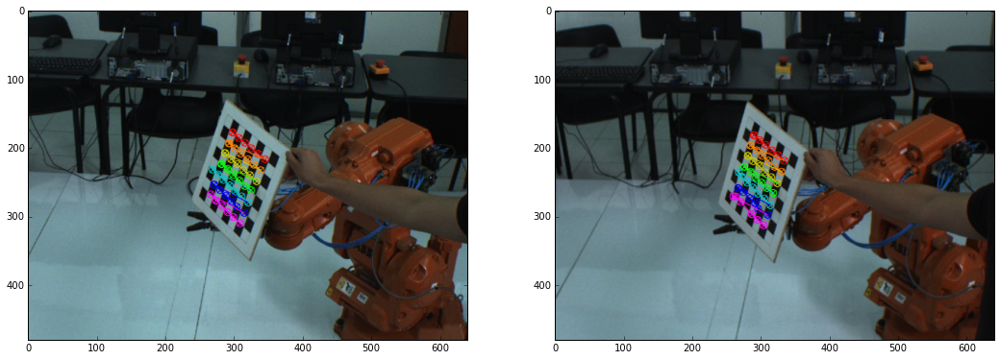

Image6-L.jpg True
Image6-R.jpg True


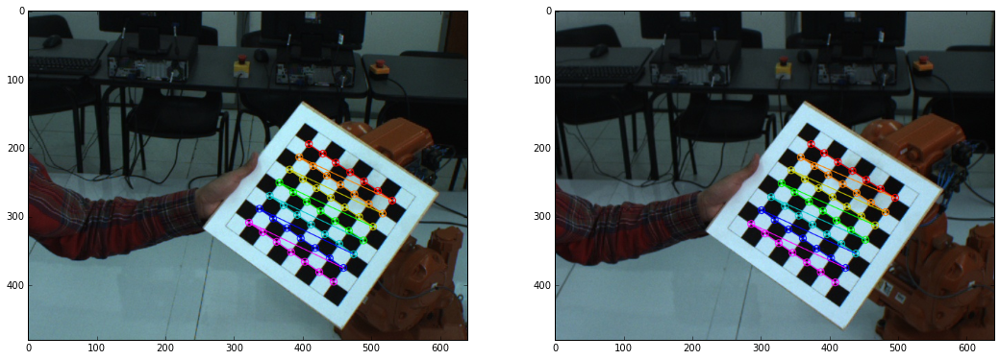

Image7-L.jpg False
Image7-R.jpg False


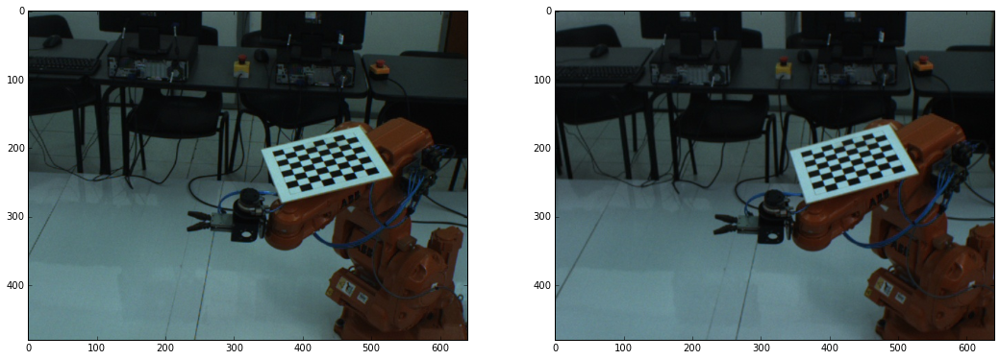

Image8-L.jpg True
Image8-R.jpg True


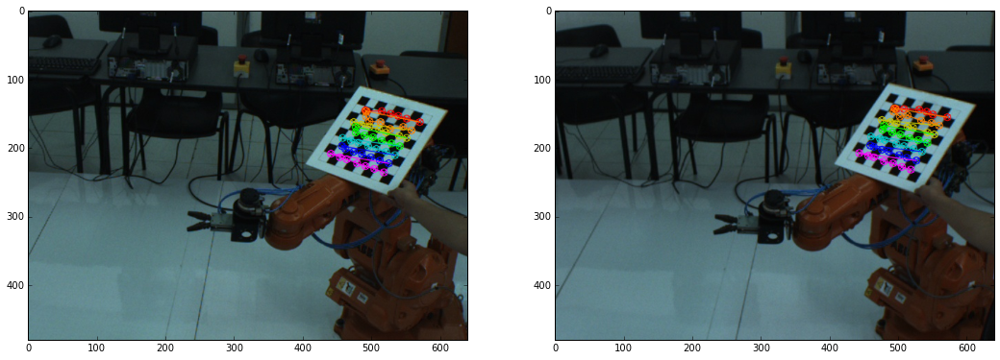

Image9-L.jpg True
Image9-R.jpg True


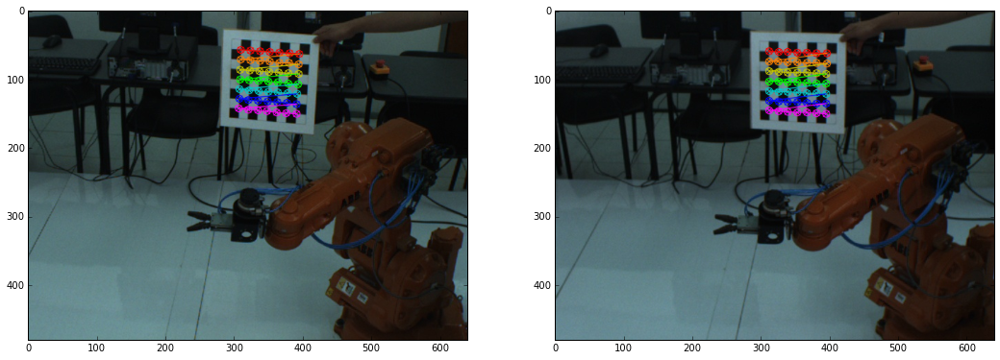

In [4]:
imagesL = glob.glob('img-1/*-L.jpg')
imagesR = glob.glob('img-1/*-R.jpg')

for fnameL, fnameR in zip(imagesL, imagesR):
    imgL = cv2.imread(fnameL)
    imgR = cv2.imread(fnameR)
    grayL = cv2.cvtColor(imgL,cv2.COLOR_BGR2GRAY)
    grayR = cv2.cvtColor(imgR,cv2.COLOR_BGR2GRAY)

    retL, cornersL = cv2.findChessboardCorners(grayL, (7,7), None)
    retR, cornersR = cv2.findChessboardCorners(grayR, (7,7), None)
    
    name1 = re.findall(r'[\w\d\-]+\.\w+',fnameL)[0]
    name2 = re.findall(r'[\w\d\-]+\.\w+',fnameR)[0]
    print name1, retL
    print name2, retR

    if retL is True:
        cv2.cornerSubPix(grayL, cornersL, (11,11), (-1,-1), crit)
        cv2.drawChessboardCorners(imgL, (7,7), cornersL, retL)

    if retR is True:
        cv2.cornerSubPix(grayR, cornersR, (11,11), (-1,-1), crit)
        cv2.drawChessboardCorners(imgR, (7,7), cornersR, retR)
    
    imgL = cv2.cvtColor(imgL, cv2.COLOR_BGR2RGB)
    imgR = cv2.cvtColor(imgR, cv2.COLOR_BGR2RGB)
    plt.subplot(1,2,1), plt.imshow(imgL)
    plt.subplot(1,2,2), plt.imshow(imgR)
    plt.show()

Segundo conjunto

Image1-L.jpg True
Image1-R.jpg True


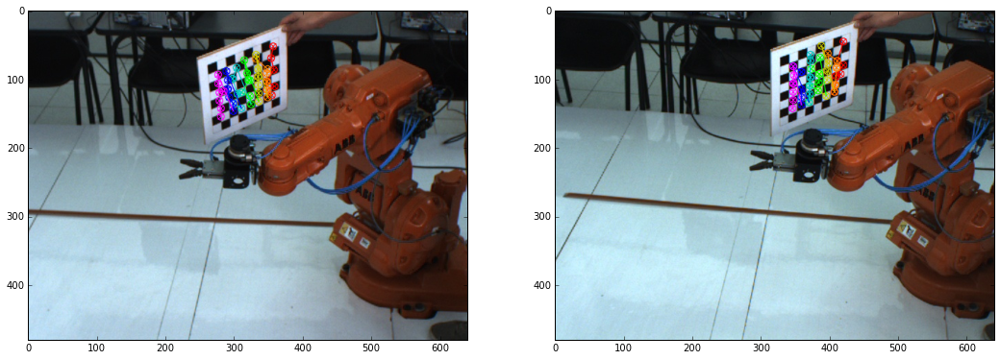

Image2-L.jpg False
Image2-R.jpg False


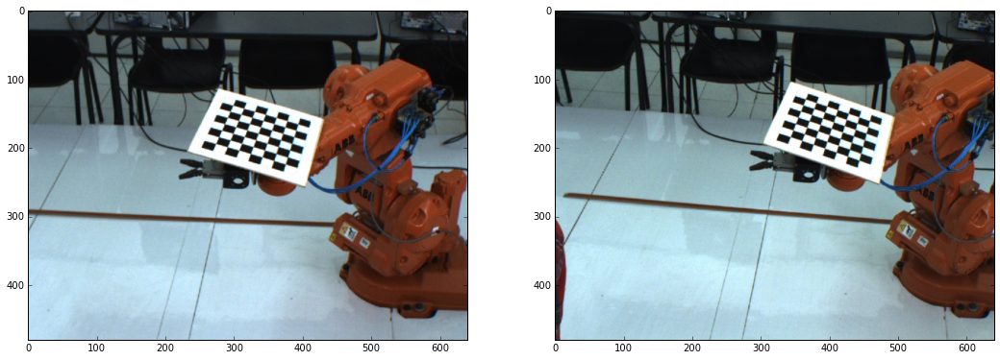

Image3-L.jpg True
Image3-R.jpg True


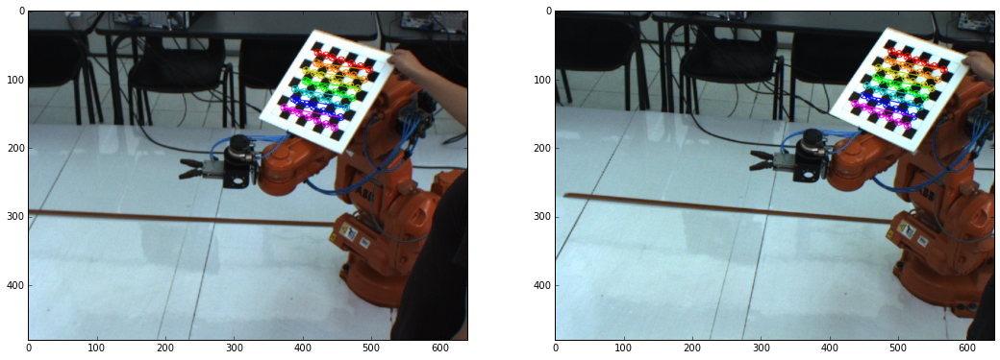

Image4-L.jpg True
Image4-R.jpg True


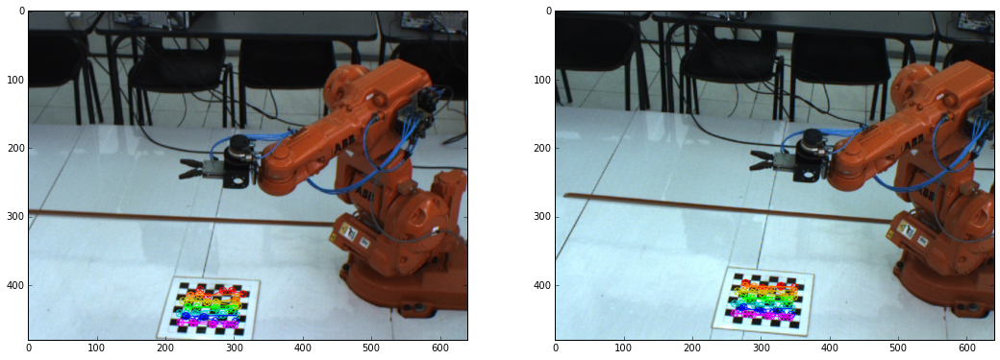

Image5-L.jpg True
Image5-R.jpg True


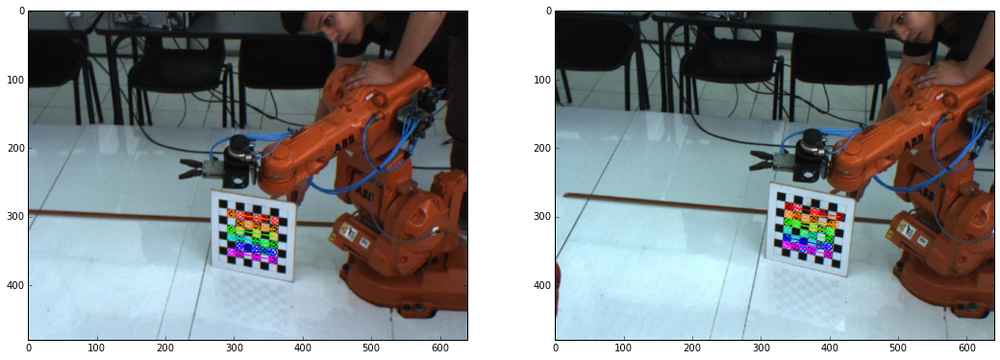

In [5]:
imagesL = glob.glob('img-2/*-L.jpg')
imagesR = glob.glob('img-2/*-R.jpg')

for fnameL, fnameR in zip(imagesL, imagesR):
    imgL = cv2.imread(fnameL)
    imgR = cv2.imread(fnameR)
    grayL = cv2.cvtColor(imgL,cv2.COLOR_BGR2GRAY)
    grayR = cv2.cvtColor(imgR,cv2.COLOR_BGR2GRAY)

    retL, cornersL = cv2.findChessboardCorners(grayL, (7,7), None)
    retR, cornersR = cv2.findChessboardCorners(grayR, (7,7), None)
    
    name1 = re.findall(r'[\w\d\-]+\.\w+',fnameL)[0]
    name2 = re.findall(r'[\w\d\-]+\.\w+',fnameR)[0]
    print name1, retL
    print name2, retR

    if retL is True:
        cv2.cornerSubPix(grayL, cornersL, (11,11), (-1,-1), crit)
        cv2.drawChessboardCorners(imgL, (7,7), cornersL, retL)

    if retR is True:
        cv2.cornerSubPix(grayR, cornersR, (11,11), (-1,-1), crit)
        cv2.drawChessboardCorners(imgR, (7,7), cornersR, retR)
    
    imgL = cv2.cvtColor(imgL, cv2.COLOR_BGR2RGB)
    imgR = cv2.cvtColor(imgR, cv2.COLOR_BGR2RGB)
    plt.subplot(1,2,1), plt.imshow(imgL)
    plt.subplot(1,2,2), plt.imshow(imgR)
    plt.show()

Con las mejores imágenes de ambos conjuntos

Image3-2-L.jpg True
Image3-2-R.jpg True


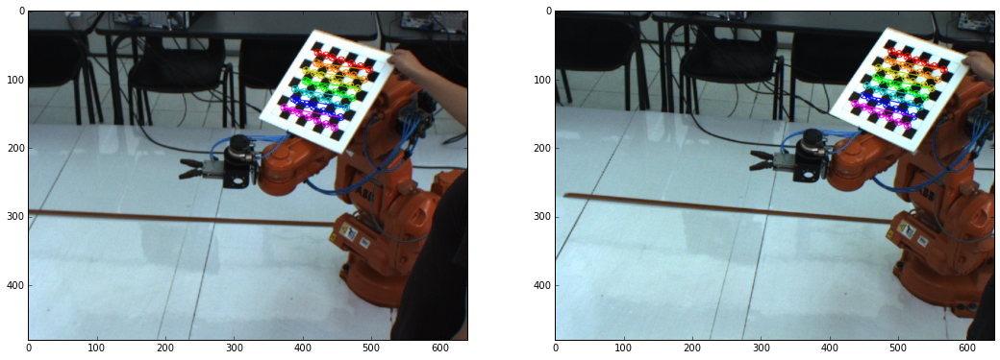

Image3-L.jpg True
Image3-R.jpg True


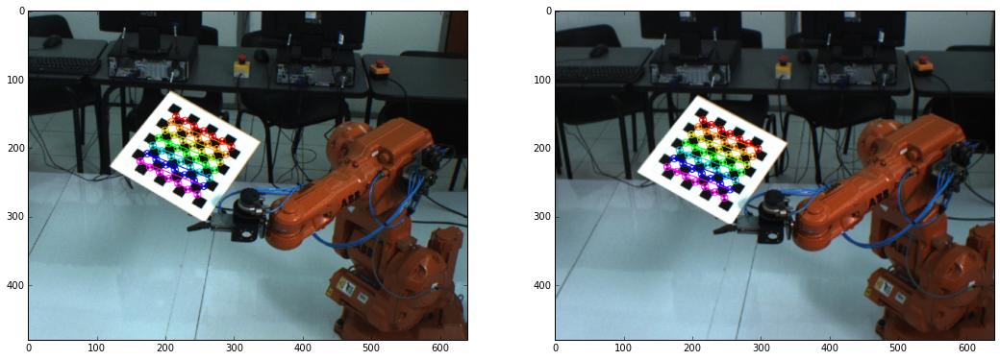

Image6-L.jpg True
Image6-R.jpg True


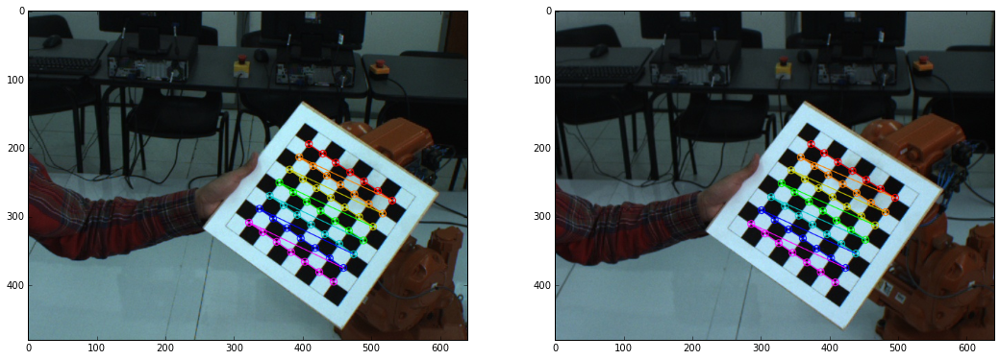

Image9-L.jpg True
Image9-R.jpg True


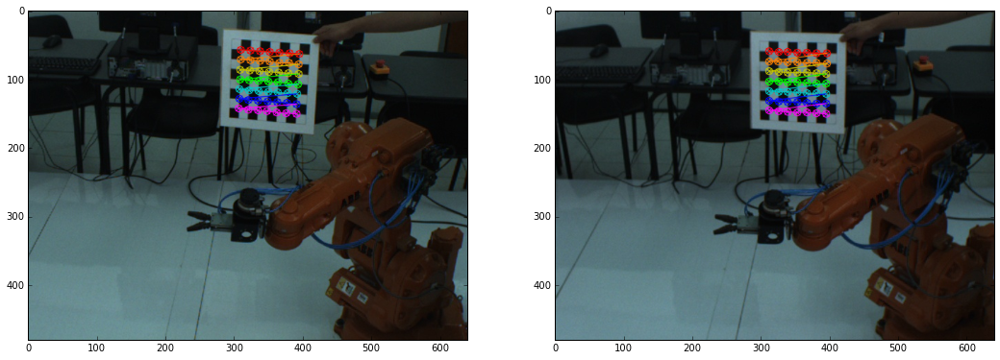

In [29]:
objpoints = []
imgpointsL = []
imgpointsR = []

imagesL = glob.glob('img/*-L.jpg')
imagesR = glob.glob('img/*-R.jpg')

for fnameL, fnameR in zip(imagesL, imagesR):
    imgL = cv2.imread(fnameL)
    imgR = cv2.imread(fnameR)
    grayL = cv2.cvtColor(imgL,cv2.COLOR_BGR2GRAY)
    grayR = cv2.cvtColor(imgR,cv2.COLOR_BGR2GRAY)

    retL, cornersL = cv2.findChessboardCorners(grayL, (7,7), None)
    retR, cornersR = cv2.findChessboardCorners(grayR, (7,7), None)
    
    name1 = re.findall(r'[\w\d\-]+\.\w+',fnameL)[0]
    name2 = re.findall(r'[\w\d\-]+\.\w+',fnameR)[0]
    print name1, retL
    print name2, retR
    
    cv2.cornerSubPix(grayL, cornersL, (11,11), (-1,-1), crit)
    cv2.drawChessboardCorners(imgL, (7,7), cornersL, retL)
    
    cv2.cornerSubPix(grayR, cornersR, (11,11), (-1,-1), crit)
    cv2.drawChessboardCorners(imgR, (7,7), cornersR, retR)
    
    objpoints.append(objp)
    imgpointsL.append(cornersL)
    imgpointsR.append(cornersR)
    
    imgL = cv2.cvtColor(imgL, cv2.COLOR_BGR2RGB)
    imgR = cv2.cvtColor(imgR, cv2.COLOR_BGR2RGB)
    plt.subplot(1,2,1), plt.imshow(imgL)
    plt.subplot(1,2,2), plt.imshow(imgR)
    plt.show()

retL, mtxL, distL, rvecsL, tvecsL = cv2.calibrateCamera(objpoints, imgpointsL, (w,h), None, None)
retR, mtxR, distR, rvecsR, tvecsR = cv2.calibrateCamera(objpoints, imgpointsR, (w,h), None, None)

In [30]:
print "Matriz cámara izquierda:\n{}\n".format(mtxL)
print "Matriz cámara derecha:\n{}".format(mtxR)

print distL, distR

Matriz cámara izquierda:
[[ 747.37143504    0.          306.9094511 ]
 [   0.          732.59648771  299.78698616]
 [   0.            0.            1.        ]]

Matriz cámara derecha:
[[ 882.43430813    0.          404.58896087]
 [   0.          867.39361573  250.40684041]
 [   0.            0.            1.        ]]
[[ -1.55980780e-01   5.10821351e-01   1.12112651e-03  -1.35075806e-02
   -3.69888394e+00]] [[ -2.14623612e-01   3.05151555e+00   2.91186816e-03   2.50686478e-03
   -3.52450474e+01]]


* Segunda cámara

In [8]:
errL = 0
errR = 0

for i in xrange(len(objpoints)):
    imgpoints2L, _ = cv2.projectPoints(objpoints[i], rvecsL[i], tvecsL[i], mtxL, distL)
    imgpoints2R, _ = cv2.projectPoints(objpoints[i], rvecsR[i], tvecsR[i], mtxR, distR)
    errorL = cv2.norm(imgpointsL[i],imgpoints2L, cv2.NORM_L2) / len(imgpoints2L)
    errorR = cv2.norm(imgpointsR[i],imgpoints2R, cv2.NORM_L2) / len(imgpoints2R)
    errL += errorL
    errR += errorR

print "Error izquierda: {}\n".format(errL/len(objpoints))
print "Error derecha:   {}".format(errR/len(objpoints))

Error izquierda: 0.0927922688337

Error derecha:   0.0616551113097


## Proyección usando las matrices de cámara

In [46]:
def draw(img, corners, imgpts):
    corner = tuple(corners[0].ravel())
    cv2.line(img, corner, tuple(imgpts[0].ravel()), (255, 0, 0), 5)
    cv2.line(img, corner, tuple(imgpts[1].ravel()), (0, 255, 0), 5)
    cv2.line(img, corner, tuple(imgpts[2].ravel()), (0, 0, 255), 5)
    return img

def drawCube(img, corners, imgpts):
    imgpts = np.int32(imgpts).reshape(-1, 2)

    # draw ground floor in green
    cv2.drawContours(img, [imgpts[:4]], -1, (0, 255, 0), -3)

    # draw pillars in blue color
    for i, j in zip(range(4), range(4, 8)):
        cv2.line(img, tuple(imgpts[i]), tuple(imgpts[j]), (255), 3)

    # draw top layer in red color
    cv2.drawContours(img, [imgpts[4:]], -1, (0, 0, 255), 3)

    return img

axis = np.float32([[4, 0, 0], [0, 4, 0], [0, 0, -4]]).reshape(-1, 3) * sq_size
axis2 = np.float32([[0, 0, 0], [0, 4, 0], [4, 4, 0], [4, 0, 0], [0, 0, -4], [0, 4, -4], [4, 4, -4], [4, 0, -4]]) * sq_size

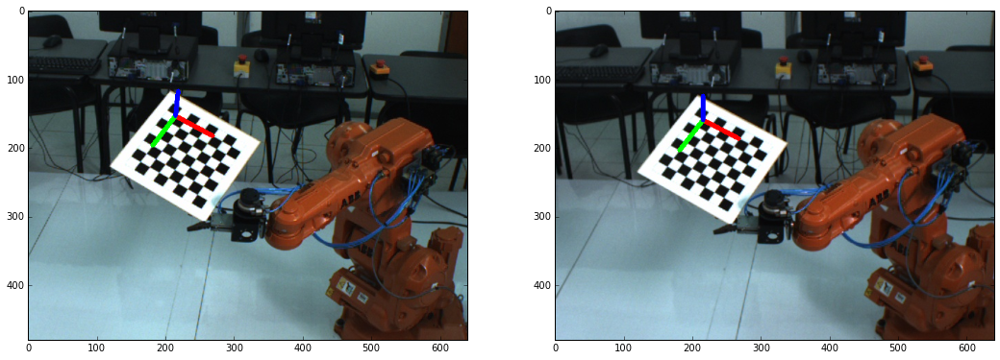

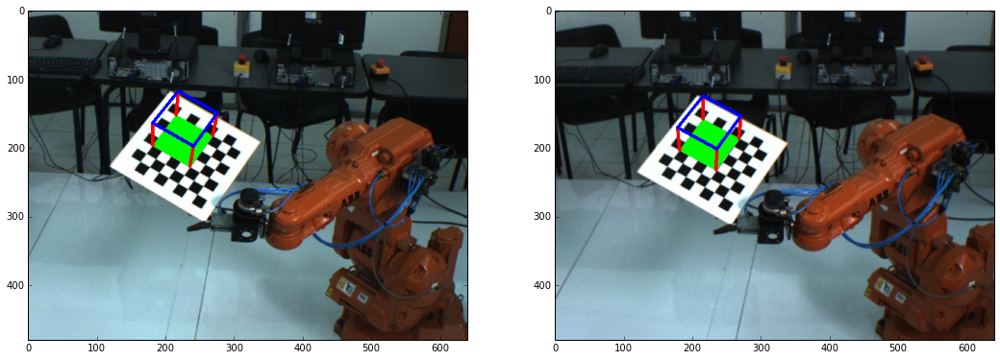

In [49]:
img1 = cv2.imread('img\Image3-L.jpg')
img2 = cv2.imread('img\Image3-R.jpg')
gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)
ret1, corners1 = cv2.findChessboardCorners(gray1, (7, 7), None)
ret2, corners2 = cv2.findChessboardCorners(gray2, (7, 7), None)
cv2.cornerSubPix(gray1, corners1, (11, 11), (-1, -1), crit)
cv2.cornerSubPix(gray2, corners2, (11, 11), (-1, -1), crit)

ret1, rvecs1, tvecs1 = cv2.solvePnP(objp, corners1, mtxL, distL)
ret2, rvecs2, tvecs2 = cv2.solvePnP(objp, corners2, mtxR, distR)

imgpts11, jac11 = cv2.projectPoints(axis, rvecs1, tvecs1, mtxL, distL)
imgpts12, jac12 = cv2.projectPoints(axis2, rvecs1, tvecs1, mtxL, distL)
imgpts21, jac21 = cv2.projectPoints(axis, rvecs2, tvecs2, mtxR, distR)
imgpts22, jac22 = cv2.projectPoints(axis2, rvecs2, tvecs2, mtxR, distR)

ax1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
cb1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
ax2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
cb2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

ax1 = draw(ax1, corners1, imgpts11)
ax2 = draw(ax2, corners2, imgpts21)

cb1 = drawCube(cb1, corners1, imgpts12)
cb2 = drawCube(cb2, corners2, imgpts22)

plt.subplot(1,2,1),plt.imshow(ax1)
plt.subplot(1,2,2),plt.imshow(ax2)
plt.show()

plt.subplot(1,2,1),plt.imshow(cb1)
plt.subplot(1,2,2),plt.imshow(cb2)
plt.show()

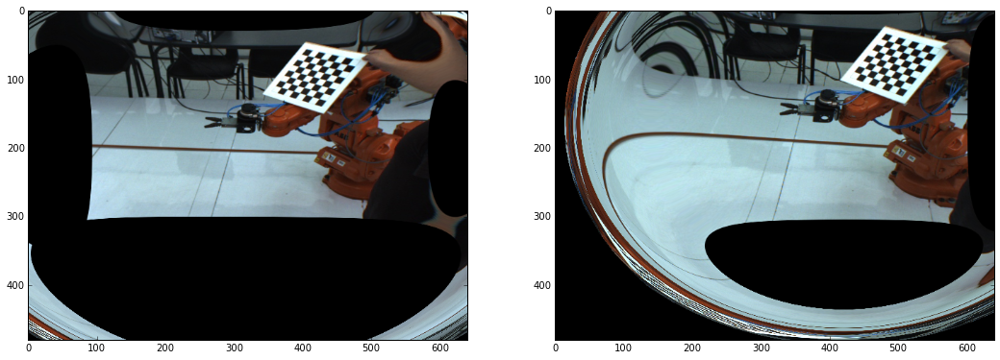

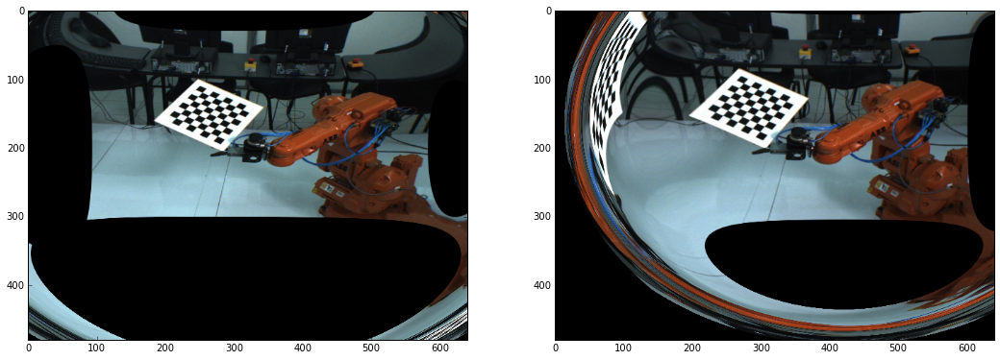

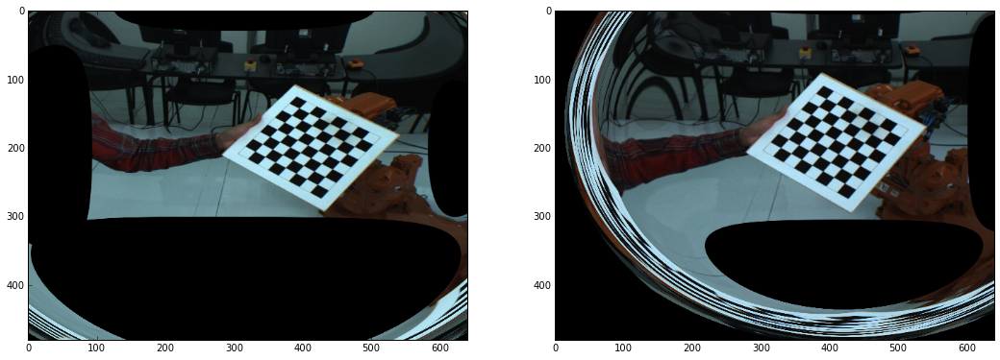

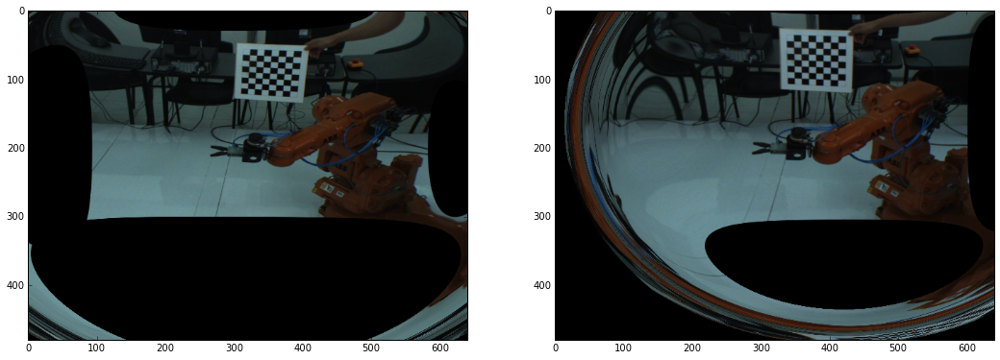

In [50]:
nmtxL, roiL = cv2.getOptimalNewCameraMatrix(mtxL, distL, (w,h), 1, (w,h))
nmtxR, roiR = cv2.getOptimalNewCameraMatrix(mtxR, distR, (w,h), 1, (w,h))

for fnameL, fnameR in zip(imagesL, imagesR):
    imgL = cv2.imread(fnameL)
    imgR = cv2.imread(fnameR)
    imgL = cv2.undistort(imgL, mtxL, distL, None, nmtxL)
    imgR = cv2.undistort(imgR, mtxR, distR, None, nmtxR)
    
    imgL = cv2.cvtColor(imgL, cv2.COLOR_BGR2RGB)
    imgR = cv2.cvtColor(imgR, cv2.COLOR_BGR2RGB)
    plt.subplot(1,2,1),plt.imshow(imgL)
    plt.subplot(1,2,2),plt.imshow(imgR)
    plt.show()

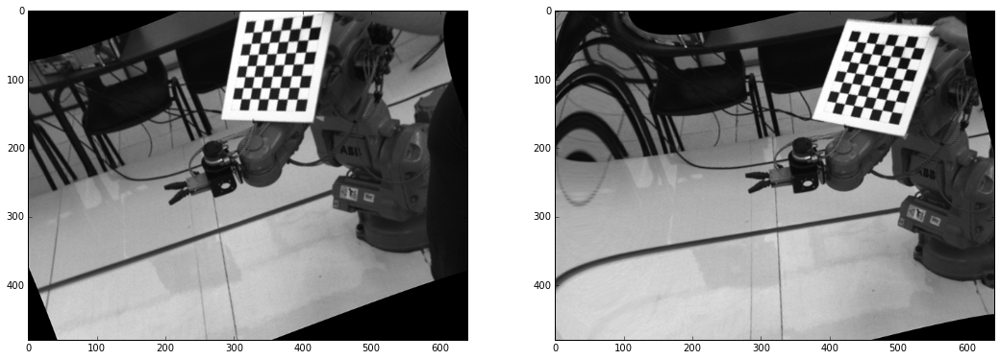

0.661463832692


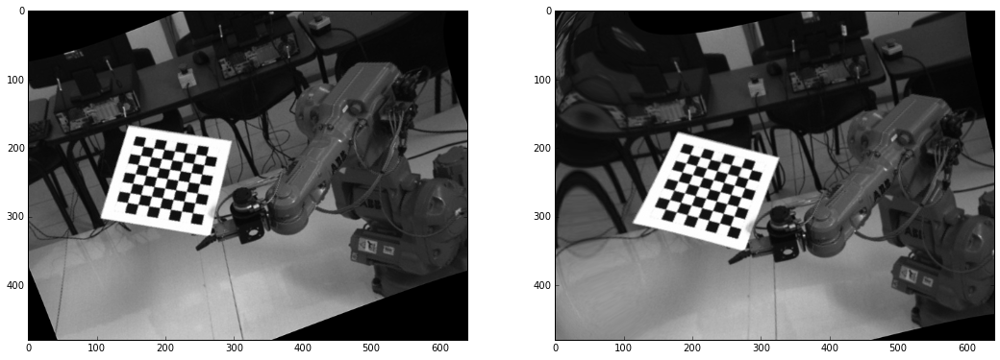

0.701529417651


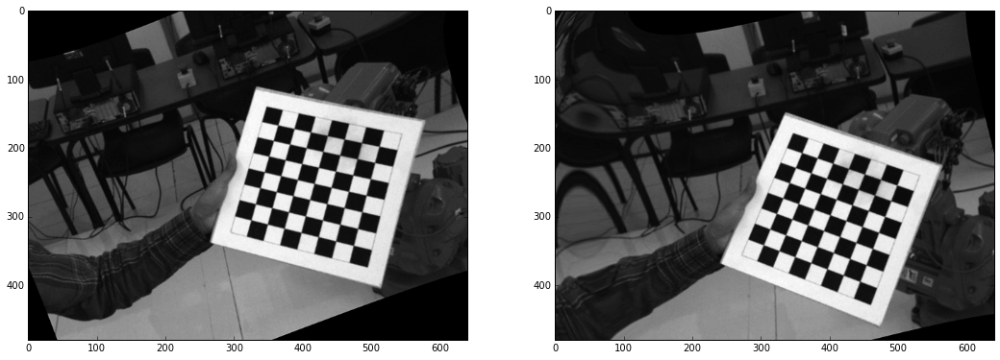

0.680023999921


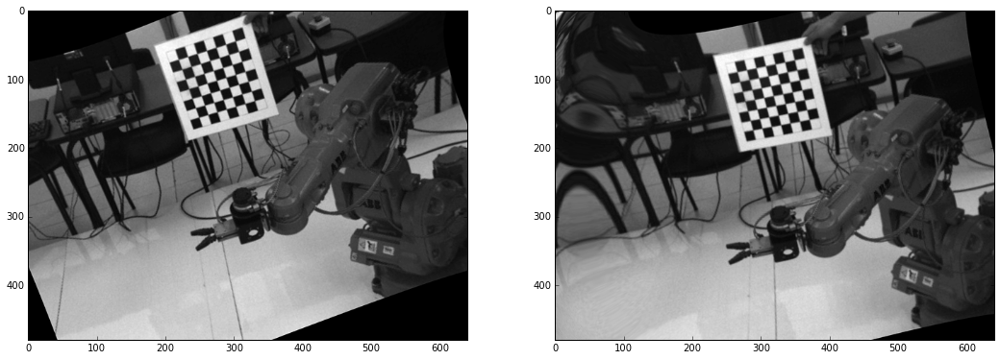

0.684454919107


In [51]:
imagesL = glob.glob('img/*L.jpg')
imagesR = glob.glob('img/*R.jpg')
goodImagesL = []
goodImagesR = []

objpoints = []
imgpoints1 = []
imgpoints2 = []

for fnameL, fnameR in zip(imagesL, imagesR):
    imgL = cv2.imread(fnameL)
    imgR = cv2.imread(fnameR)
    
    grayL = cv2.cvtColor(imgL, cv2.COLOR_BGR2GRAY)
    grayR = cv2.cvtColor(imgR, cv2.COLOR_BGR2GRAY)
    retL, cornersL = cv2.findChessboardCorners(grayL, GRID_SIZE)
    retR, cornersR = cv2.findChessboardCorners(grayR, GRID_SIZE)
        
    if retL is True and retR is True:
        objpoints.append(objp)
        cv2.cornerSubPix(grayL, cornersL, (11,11), (-1,-1), crit)
        cv2.cornerSubPix(grayR, cornersR, (11,11), (-1,-1), crit)
        imgpoints1.append(cornersL)
        imgpoints2.append(cornersR)
        cv2.drawChessboardCorners(imgL, (8,6), cornersL, retL)
        cv2.drawChessboardCorners(imgR, (8,6), cornersR, retR)
        goodImagesL.append(fnameL)
        goodImagesR.append(fnameR)
        
retL, mtxL, distL, rvecsL, tvecsL = cv2.calibrateCamera(objpoints, imgpoints1, RESOLUTION)
retR, mtxR, distR, rvecsR, tvecsR = cv2.calibrateCamera(objpoints, imgpoints2, RESOLUTION)

ret, _, _, _, _, R, T, E, F  = cv2.stereoCalibrate(objpoints, imgpoints1, imgpoints2, RESOLUTION)
R1, R2, P1, P2, Q, _, _ = cv2.stereoRectify(mtxL, distL, mtxR, distR, RESOLUTION, R, T, flags=cv2.CALIB_ZERO_DISPARITY)

map1L, map2L = cv2.initUndistortRectifyMap(mtxL, distL, R1, mtxL, RESOLUTION, cv2.CV_16SC2)
map1R, map2R = cv2.initUndistortRectifyMap(mtxR, distR, R2, mtxR, RESOLUTION, cv2.CV_16SC2)

for fnameL, fnameR in zip(goodImagesL, goodImagesR):
    # name = re.findall(r'[\w\d\-]+\.\w+',fname)[0]
    time = t.clock()
    imgL = cv2.imread(fnameL)
    imgR = cv2.imread(fnameR) 
    imgL = cv2.remap(imgL, map1L, map2L, cv2.INTER_CUBIC)
    imgR = cv2.remap(imgR, map1R, map2R, cv2.INTER_CUBIC)
    imgL = cv2.cvtColor(imgL, cv2.COLOR_BGR2GRAY)
    imgR = cv2.cvtColor(imgR, cv2.COLOR_BGR2GRAY)
    # cv2.imwrite('stereo-example2/img-rectified/rectL'+name, dstL)
    # cv2.imwrite('stereo-example2/img-rectified/rectR'+name, dstR)
    plt.subplot(1,2,1), plt.imshow(imgL, 'gray')
    plt.subplot(1,2,2), plt.imshow(imgR, 'gray')
    plt.show()
    print t.clock() - time

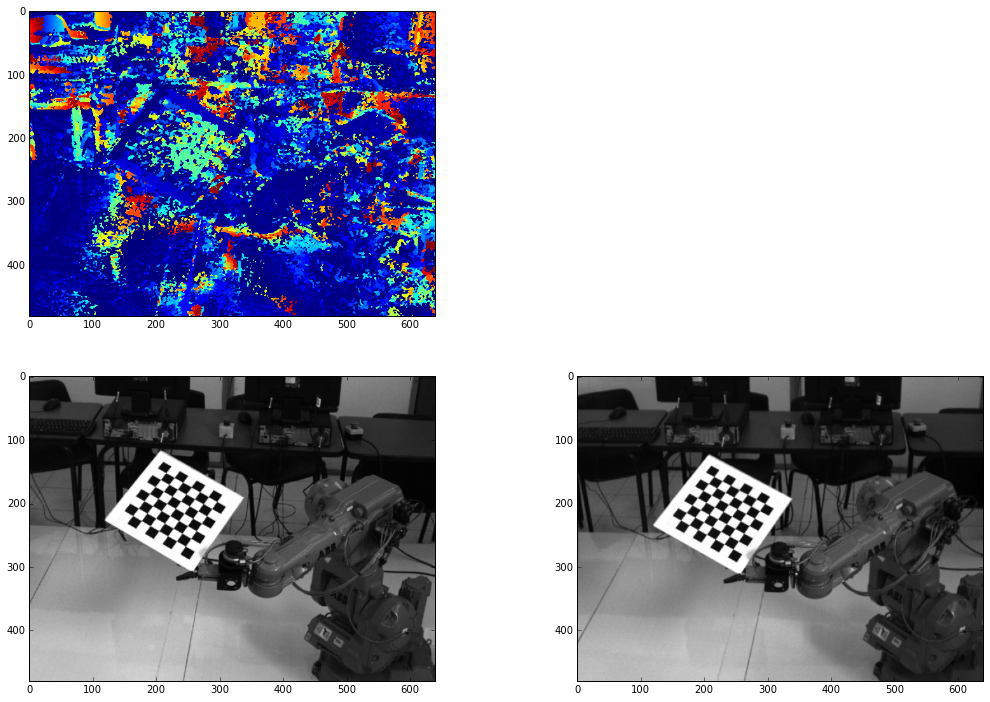

In [52]:
import ipywidgets as widgets
from IPython.display import display

def stereoSGBM(m=0, w=1):
    imgL = cv2.imread('img/Image3-L.jpg')
    imgR = cv2.imread('img/Image3-R.jpg')
    # imgL = cv2.remap(imgL, map1L, map2L, cv2.INTER_CUBIC)
    # imgR = cv2.remap(imgR, map1R, map2R, cv2.INTER_CUBIC)
    grayL = cv2.cvtColor(imgL,cv2.COLOR_BGR2GRAY)
    grayR = cv2.cvtColor(imgR,cv2.COLOR_BGR2GRAY)
    stereo = cv2.StereoSGBM(m, 160-m, w)
    disparity = stereo.compute(grayL,grayR)
    plt.subplot(2,2,1),plt.imshow(disparity)
    plt.subplot(2,2,3),plt.imshow(grayL, 'gray')
    plt.subplot(2,2,4),plt.imshow(grayR, 'gray')
    plt.show()
    
min_slider = widgets.IntSlider(min=0, max=160, step=16, value=0, description='minDisparity')
win_slider = widgets.IntSlider(min=1, max=11, step=2, value=1, description='SADWindowSize')

w = widgets.interactive(stereoSGBM,m=min_slider, w=win_slider)
display(w)